In [22]:
import sys
sys.path.insert(0, '..')

In [23]:
from database.dataset import INBreast_Dataset
from mc_candidate_proposal.hough_mc import HoughCalcificationDetection
from mc_candidate_proposal.hdog_mc import HDoGCalcificationDetection
from mc_candidate_proposal.morphology_mc import MorphologyCalcificationDetection
#from general_utils.metrics import circle_comparison, quick_circle_comparison
from general_utils.plots import plot_blobs, plot_blobs_2_sets
from general_utils.utils import min_max_norm
from pathlib import Path
from tqdm import tqdm
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
from metrics.metrics_utils import get_tp_fp_fn_center_patch_criteria

In [24]:
os.getcwd()

'/home/acortinau/projects/calc-det/notebooks'

In [25]:
db = INBreast_Dataset(
    return_lesions_mask=True,
    level='image',
    max_lesion_diam_mm=None,
    extract_patches=False,
    partitions = ['train', 'validation'],
    lesion_types = ['calcification', 'cluster'],
    cropped_imgs = True,
    keep_just_images_of_lesion_type = False,
    use_muscle_mask=False,
    ignore_diameter_px = 15
)

### hough

In [6]:
# HOUGH

dehazing_params = {'omega': 0.9, 'window_size': 11, 'radius': 40, 'eps': 1e-5}

hough1_params = {'method': cv2.HOUGH_GRADIENT, 'dp': 1, 'minDist': 10,
                 'param1': 300, 'param2': 5,  'minRadius': 2, 'maxRadius': 10}
hough2_params = {'method': cv2.HOUGH_GRADIENT, 'dp': 1, 'minDist': 20,
                 'param1': 300, 'param2': 3,  'minRadius': 2, 'maxRadius': 10}

back_ext_radius = 50
erosion_iter = 20
erosion_size = 5
min_hough2_distance = 6
filter_muscle=False
processed_imgs_path = '/home/acortinau/projects/calc-det/data/hough_img'

hd = HoughCalcificationDetection(
    dehazing_params, back_ext_radius, processed_imgs_path, hough1_params, hough2_params,
    erosion_iter=erosion_iter, erosion_size=erosion_size, min_hough2_dist=min_hough2_distance,
    filter_muscle_region=filter_muscle)


In [45]:
db.df.loc[db.df.img_id == 22613822]

,img_id,n_rois,side,view,filename,acr,artifact,birads,case_id,finding_notes,lesion_annot,pectoral_muscle,mass,micros,distortion,asymmetry,breast_bbox,partition,img_size,muscle_mask,case_label,img_label,label
34,22613822,148,R,MLO,data/INbreast Release 1.0/AllPNGs/full_imgs/22...,2,False,5,45c7f44839fd9e68,nódulo + microcalcificações,yes,False,True,True,False,False,"[(1783, 6), (3328, 3117)]",train,"(3111, 1545)",True,abnormal,abnormal,abnormal


In [46]:
idx = 34
mask = db[idx]['lesion_mask']
image = db[idx]['img']
image_id = db.df.iloc[idx].img_id
true_bboxes = db[idx]['lesion_bboxes']

h1_circles, h2_circles = hd.detect(image, image_id, load_processed_images=True, hough2=True)
print(f'Image ID: {db[idx]["img_id"]}')

Image ID: 22613822


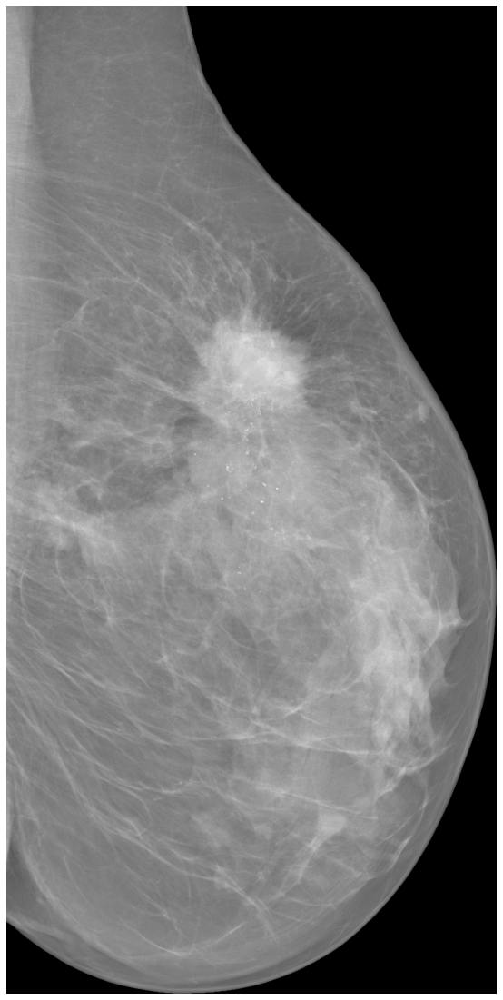

In [47]:
f, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(min_max_norm(image,255).astype('uint8'),cmap='gray')
plt.axis('off')
plt.show()

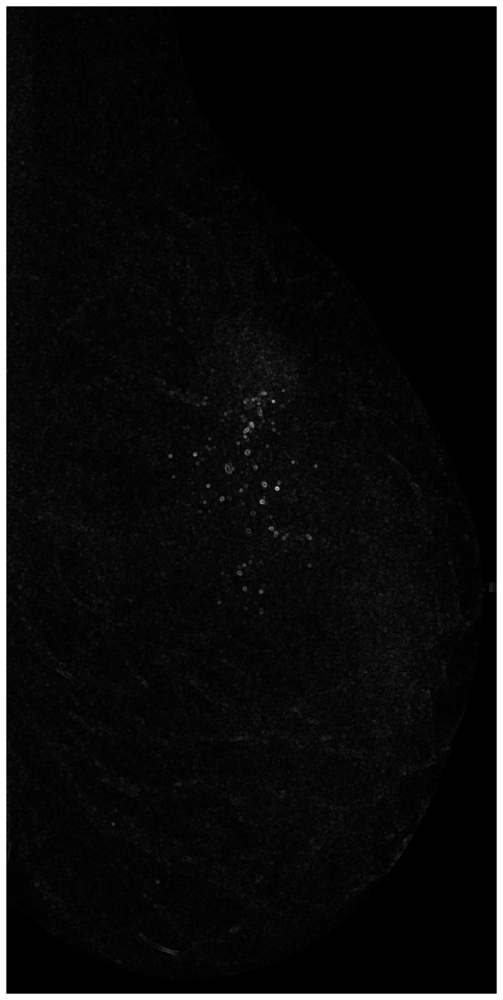

In [48]:
image_preprocessed = cv2.imread(f'/home/acortinau/projects/calc-det/data/hough_img/{image_id}.tiff',cv2.IMREAD_ANYDEPTH)
f, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(image_preprocessed,cmap='gray')
plt.axis('off')
plt.show()


In [53]:
h1_circles

array([[ 594, 1413,    7],
       [ 770, 1176,    9],
       [ 948, 1671,    9],
       ...,
       [ 895, 1285,    2],
       [1128, 1289,    2],
       [1175, 2183,    2]])

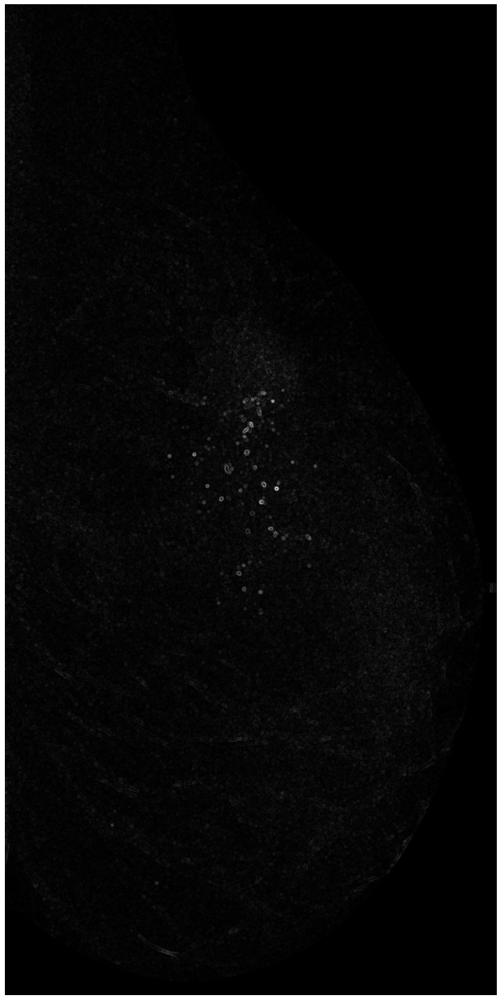

In [57]:
plot_blobs(min_max_norm(image_preprocessed,255),h1_circles[1:0])

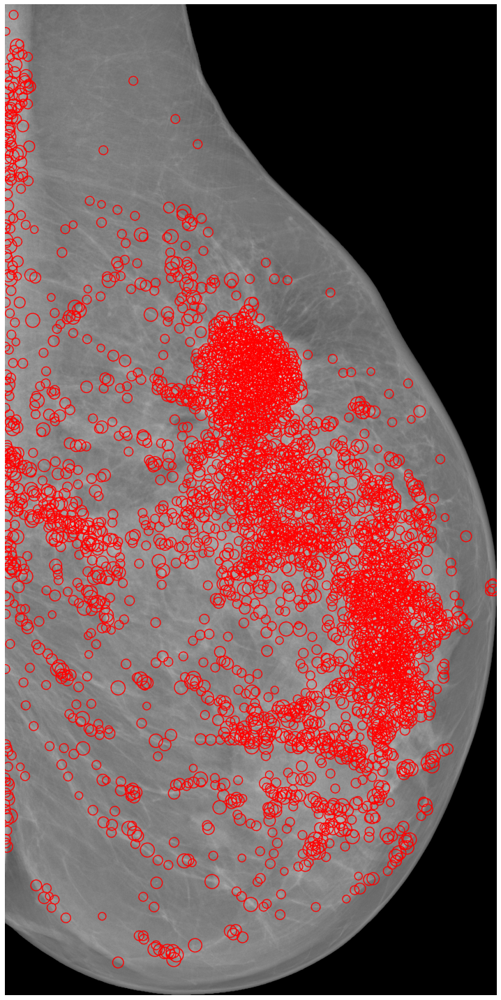

In [49]:
plot_blobs(min_max_norm(image,255),h1_circles)

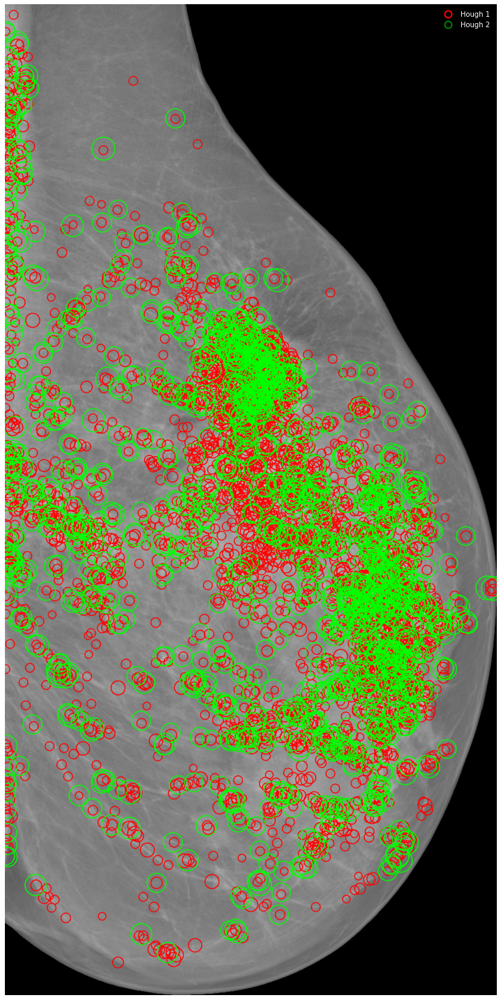

In [50]:
plot_blobs_2_sets(min_max_norm(image,255),h1_circles,h2_circles,label_a='Hough 1',label_b='Hough 2')

### HDOG

In [7]:
# HDOG
dog_parameters = {
    'min_sigma': 1,
    'max_sigma': 3,
    'n_scales': 20,
    'sigma_ratio': None,
    'dog_blob_th': 0.006,
    'dog_overlap': 0.2,
    'dog_min_dist': 6,
}

hessian_parameters = {
    'method': 'eigenval',
    'hessian_threshold': None,
    'hessian_th_divider': 300
}

filter_muscle=False
processed_imgs_path = '/home/acortinau/projects/calc-det/data/hough_img'

hdogd = HDoGCalcificationDetection(dog_parameters, hessian_parameters,filter_muscle_region=filter_muscle)

In [9]:
idx = 34
mask = db[idx]['lesion_mask']
image = db[idx]['img']
image_id = db.df.iloc[idx].img_id
true_bboxes = db[idx]['lesion_bboxes']

detections = hdogd.detect(image, image_id, False, False)

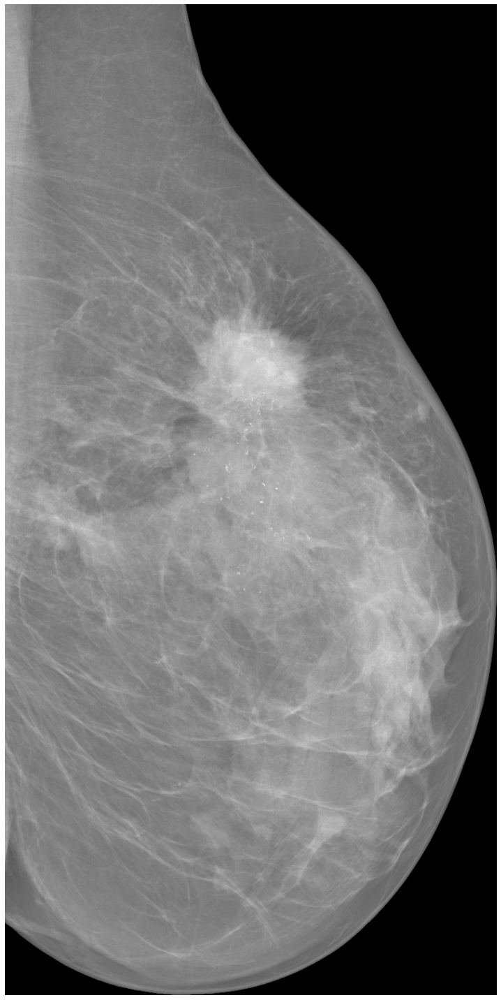

In [12]:
plot_blobs(min_max_norm(image,255),detections[1:0])

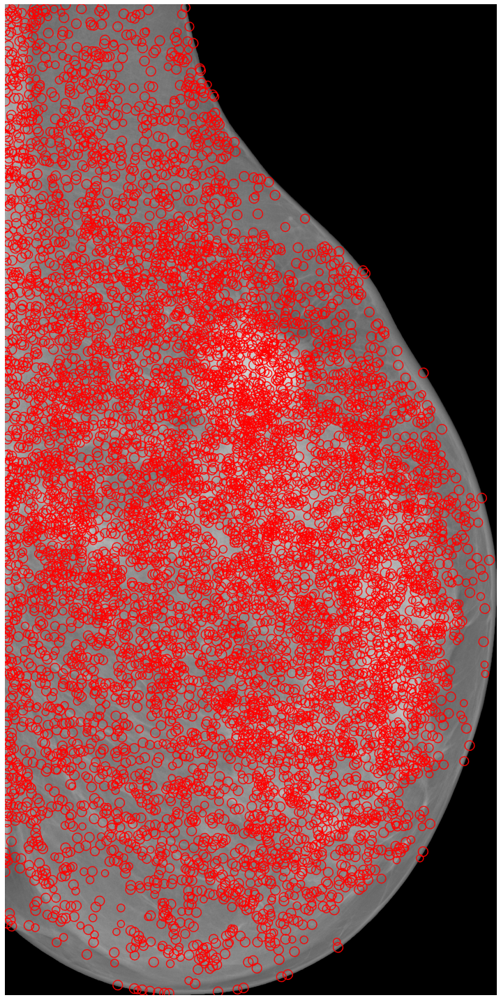

In [13]:
plot_blobs(min_max_norm(image,255),detections)

In [23]:
dog_parameters_m = {
    'min_sigma': 1.18,
    'max_sigma': 3.1,
    'n_scales': None,
    'sigma_ratio': 1.05,
    'dog_blob_th': 0.006,
    'dog_overlap': 0.8,
    'dog_min_dist': 10,
}

hessian_parameters_m = {
    'method': 'marasinou',
    'hessian_threshold': 1.4,
    'hessian_th_divider': 300
}

filter_muscle=False
processed_imgs_path = '/home/acortinau/projects/calc-det/data/hough_img'

hdogdm = HDoGCalcificationDetection(dog_parameters_m, hessian_parameters_m,filter_muscle_region=filter_muscle)
detections_mar = hdogdm.detect(image, image_id, False, False)


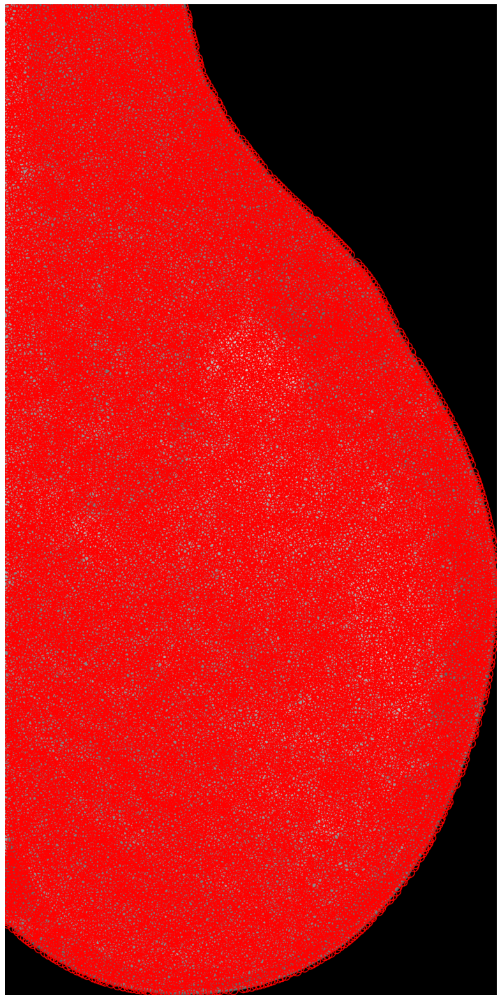

In [24]:
plot_blobs(min_max_norm(image,255),detections_mar)

In [25]:
dog,hessian = hdogd.get_dog_and_hessian_info(image,image_id)

(-0.5, 226.5, 225.5, -0.5)

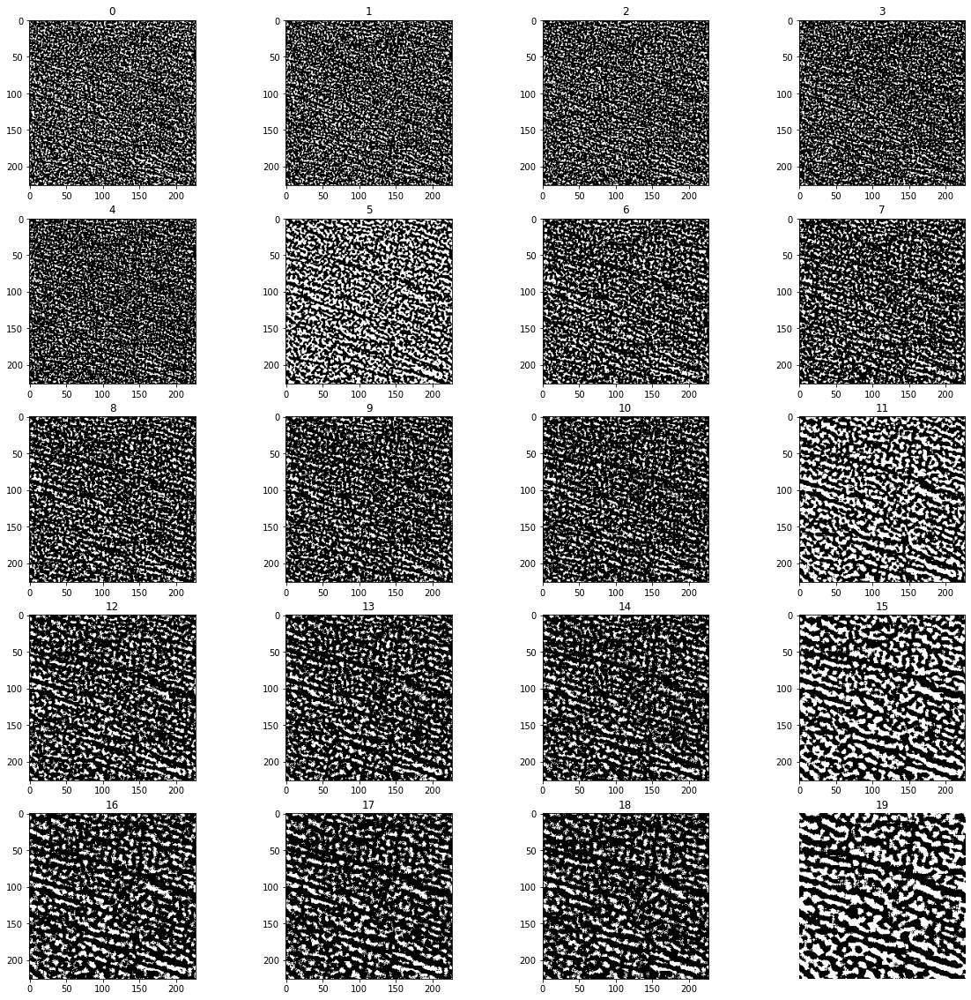

In [38]:
f, axs = plt.subplots(5, 4, figsize=(20, 20))
axs = axs.ravel()
for i in range(20):
    axs[i].imshow(dog[:,:,i][514:740,257:484],cmap='gray')
    axs[i].set_title(f'{i}')
plt.axis('off')
    

In [40]:
dog2,hessian_m = hdogdm.get_dog_and_hessian_info(image,image_id) # each scale has 3 hessian submatrices

In [ ]:
import pickle
with open('hessian_b.p', 'wb') as f:
    pickle.dump((hessian, hessian_m), f)
    

### GM

In [27]:
threshold = 0.95
min_distance = 6
area = 14
filter_muscle=False

idx = 34
case = db[idx]
image = case['img']
image_id = case['img_id']
lesion_mask = case['lesion_mask']
processed_imgs_path = '/home/acortinau/projects/calc-det/data/gsm_imgs'

md = MorphologyCalcificationDetection(
    processed_imgs_path, threshold=threshold, min_distance=min_distance,
    area=area*area, store_intermediate=False, filter_muscle_region=filter_muscle)

candidate_blobs = md.detect(image, image_id)
tp, fp, fn, ignored = get_tp_fp_fn_center_patch_criteria(candidate_blobs, lesion_mask, None, 14)

In [29]:
tp.head(20)

,x,y,radius,label,repeted_idxs,matching_gt
0,476,2758,1,TP,0,5
1,337,2577,1,TP,1,4
2,802,1912,1,TP,2,16
3,802,1912,1,TP,2,17
4,802,1912,1,TP,2,19
5,807,1906,0,TP,5,16
6,807,1906,0,TP,5,17
7,807,1906,0,TP,5,18
8,807,1906,0,TP,5,19
9,802,1901,3,TP,9,18


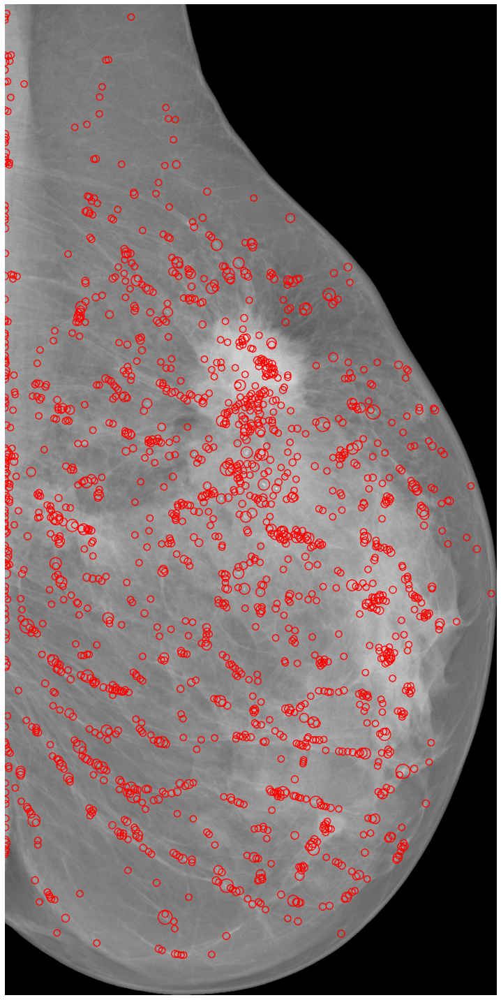

In [9]:
plot_blobs(min_max_norm(image,255),candidate_blobs)

In [8]:
rbd_image = md.reconstruction_by_dialation(image,circle_size=14)

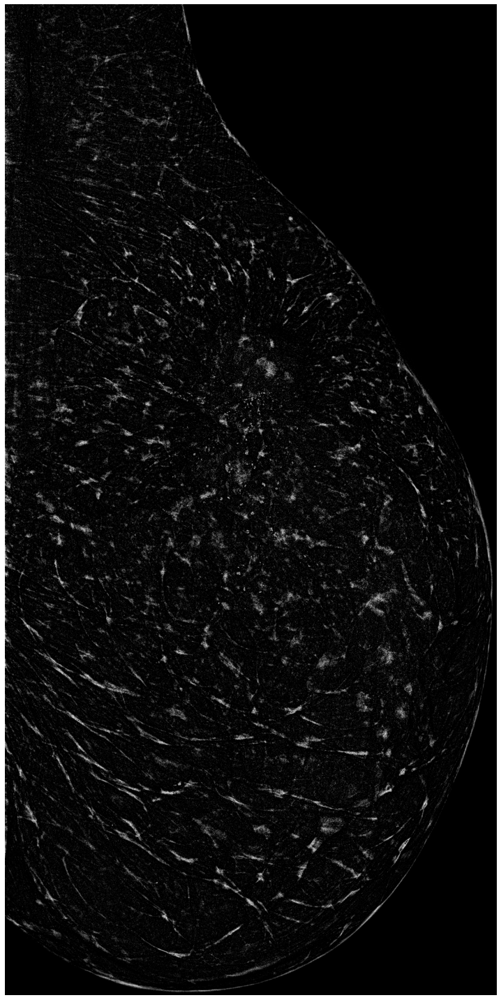

In [14]:
plot_blobs(rbd_image,candidate_blobs[1:0])

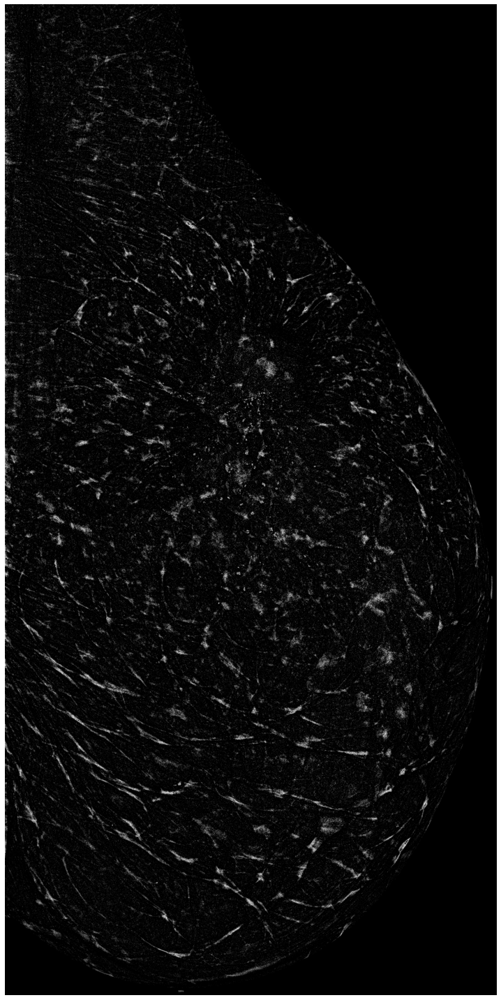

In [16]:
rbd_image_bbound = md.breast_boundary_erosion(rbd_image)
plot_blobs(rbd_image_bbound,candidate_blobs[1:0])

In [18]:

trheshold = np.quantile(
            rbd_image_bbound[rbd_image_bbound != 0].ravel(), q=threshold)
thr1_rbd = rbd_image_bbound.copy()
thr1_rbd[thr1_rbd <= trheshold] = 0

trheshold = np.quantile(rbd_image_bbound[thr1_rbd > 0].ravel(), q=0.8)
thr_rbd = rbd_image_bbound.copy()
thr_rbd[thr_rbd <= trheshold] = 0

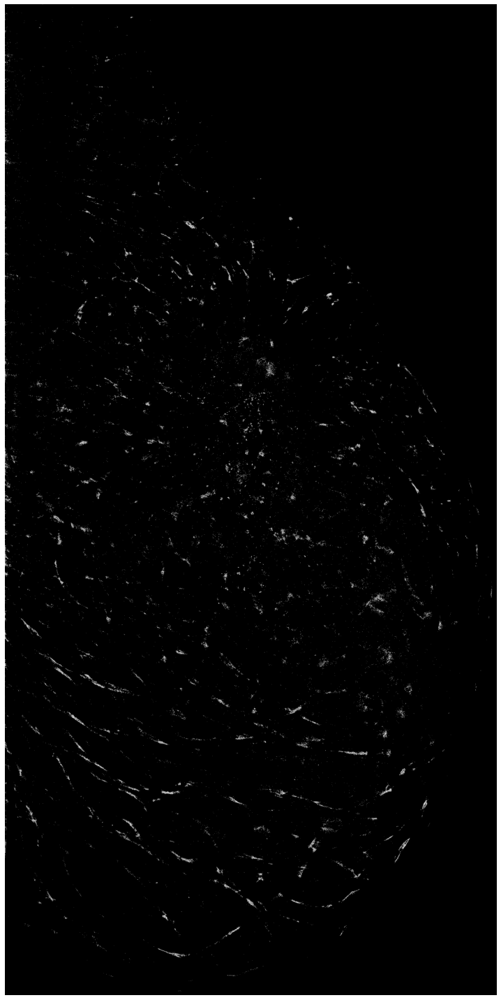

In [19]:
plot_blobs(thr1_rbd,candidate_blobs[1:0])

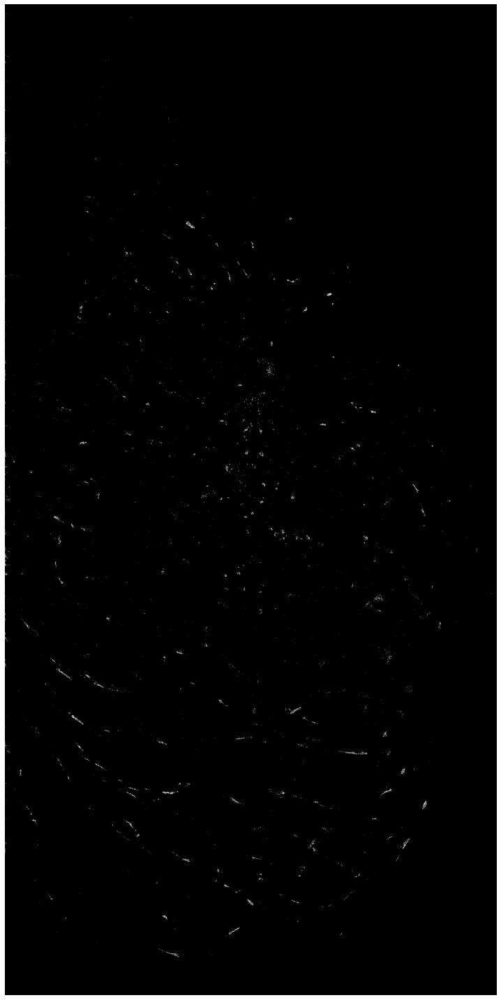

In [20]:
plot_blobs(thr_rbd,candidate_blobs[1:0])